# Восстановление золота из руды

## Подготовка данных

In [1]:
!pip install pandas-profiling[notebook]

     |████████████████████████████████| 324 kB 2.0 MB/s eta 0:00:01
     |████████████████████████████████| 357 kB 19.9 MB/s eta 0:00:01
     |████████████████████████████████| 679 kB 52.0 MB/s eta 0:00:01
     |████████████████████████████████| 102 kB 16.5 MB/s eta 0:00:01
     |████████████████████████████████| 296 kB 15.7 MB/s eta 0:00:01
     |████████████████████████████████| 460 kB 8.1 MB/s eta 0:00:01
     |████████████████████████████████| 6.9 MB 37.1 MB/s eta 0:00:01
     |████████████████████████████████| 4.7 MB 11.4 MB/s eta 0:00:01
     |████████████████████████████████| 2.1 MB 11.7 MB/s eta 0:00:01     |███▋                            | 235 kB 11.7 MB/s eta 0:00:01
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27085 sha256=9e0c1c740b48fa48ba88bf5813443e948e7d893f8b9eb9b83f495a54a4b86c1d
  Stored in directory: /home/jovyan/.cache/pip/wheels/1d/05/04/c6d7d3b66539d9e659ac6dfe81e2d0fd4c1a8316cc5a403300
Successfully built htmlmin


In [3]:
import pandas as pd
import numpy as np
import pandas_profiling
import matplotlib
from sklearn.metrics import mean_absolute_error, make_scorer
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
import seaborn as sns
from sklearn.dummy import DummyRegressor

In [4]:
try:
    data_train = pd.read_csv('/datasets/gold_industry_train.csv')
    data_test = pd.read_csv('/datasets/gold_industry_test.csv')
    data_full = pd.read_csv('/datasets/gold_industry_full.csv')
    
except:
    data_train = pd.read_csv('C:/Documents/datasets/gold_industry_train.csv')
    data_test = pd.read_csv('C:/Documents/datasets/gold_industry_test.csv')
    data_full = pd.read_csv('C:/Documents/datasets/gold_industry_full.csv')

In [5]:
display(data_train.info())
display(data_train.describe())
display(data_train)
for i in data_train:
    data_train[i] = data_train[i].interpolate(method='pad')
data_train = data_train.set_index('date')
data_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14579 entries, 0 to 14578
Data columns (total 87 columns):
 #   Column                                              Non-Null Count  Dtype  
---  ------                                              --------------  -----  
 0   date                                                14579 non-null  object 
 1   rougher.input.feed_au                               14579 non-null  float64
 2   rougher.input.feed_ag                               14579 non-null  float64
 3   rougher.input.feed_pb                               14507 non-null  float64
 4   rougher.input.feed_sol                              14502 non-null  float64
 5   rougher.input.feed_rate                             14572 non-null  float64
 6   rougher.input.feed_size                             14478 non-null  float64
 7   rougher.input.floatbank10_sulfate                   14548 non-null  float64
 8   rougher.input.floatbank10_xanthate                  14572 non-null  float64


None

,rougher.input.feed_au,rougher.input.feed_ag,rougher.input.feed_pb,rougher.input.feed_sol,rougher.input.feed_rate,rougher.input.feed_size,rougher.input.floatbank10_sulfate,rougher.input.floatbank10_xanthate,rougher.state.floatbank10_a_air,rougher.state.floatbank10_a_level,...,secondary_cleaner.output.tail_sol,final.output.concentrate_au,final.output.concentrate_ag,final.output.concentrate_pb,final.output.concentrate_sol,final.output.recovery,final.output.tail_au,final.output.tail_ag,final.output.tail_pb,final.output.tail_sol
count,14579.000000,14579.000000,14507.000000,14502.000000,14572.000000,14478.000000,14548.000000,14572.000000,14579.000000,14579.000000,...,13659.000000,14579.000000,14578.000000,14578.000000,14387.000000,14579.000000,14579.000000,14578.000000,14504.000000,14574.000000
mean,8.352941,8.877460,3.604221,36.561420,474.332784,58.922712,12.427399,5.994854,1104.208278,-379.367166,...,7.111347,43.979499,5.192145,9.923809,9.566676,66.759066,3.087939,9.731972,2.719985,10.612745
std,1.934376,1.922536,1.056063,5.209823,108.503552,22.407410,3.428939,1.152873,162.235606,94.652311,...,3.909951,5.471437,1.388014,1.706976,2.805654,10.619709,0.915187,2.358143,0.958929,2.871075
min,0.010000,0.010000,0.010000,0.010000,0.002986,0.049194,0.001083,0.000568,-0.042069,-657.949759,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,6.932996,7.341922,2.880490,34.093951,411.048483,47.278490,10.002832,5.304167,999.644856,-499.861797,...,3.784897,43.345906,4.283347,9.103183,7.860030,63.114596,2.505287,8.088928,2.036512,9.013412
50%,8.225284,8.715859,3.532399,37.097511,498.187968,54.361187,12.003320,6.003053,1000.982624,-300.314199,...,7.629968,44.975014,5.118647,10.046455,9.301970,67.962788,3.029238,9.818512,2.774847,10.670515
75%,9.832210,10.255843,4.257282,39.899799,549.586552,64.464926,14.929903,6.796632,1292.663971,-299.989315,...,10.367050,46.275153,5.925380,10.981203,11.001573,72.598187,3.614098,11.169187,3.353845,12.130827
max,13.731330,14.596026,7.052325,53.475325,717.508837,484.967466,36.118275,9.703448,1512.299531,-273.776101,...,26.000772,52.756638,16.001945,16.705297,19.423912,100.000000,8.245022,19.552149,5.804178,22.317730


,date,rougher.input.feed_au,rougher.input.feed_ag,rougher.input.feed_pb,rougher.input.feed_sol,rougher.input.feed_rate,rougher.input.feed_size,rougher.input.floatbank10_sulfate,rougher.input.floatbank10_xanthate,rougher.state.floatbank10_a_air,...,secondary_cleaner.output.tail_sol,final.output.concentrate_au,final.output.concentrate_ag,final.output.concentrate_pb,final.output.concentrate_sol,final.output.recovery,final.output.tail_au,final.output.tail_ag,final.output.tail_pb,final.output.tail_sol
0,2016-01-15 00:00:00,6.486150,6.100378,2.284912,36.808594,523.546326,55.486599,11.986616,6.007990,999.706909,...,8.764648,42.192020,6.055403,9.889648,5.507324,70.541216,2.143149,10.411962,0.895447,16.904297
1,2016-01-15 01:00:00,6.478583,6.161113,2.266033,35.753385,525.290581,57.278666,11.971193,6.005766,1000.286398,...,9.001494,42.701629,6.029369,9.968944,5.257781,69.266198,2.224930,10.462676,0.927452,16.634514
2,2016-01-15 02:00:00,6.362222,6.116455,2.159622,35.971630,530.026610,57.510649,11.920603,6.197377,999.719565,...,8.842896,42.657501,6.055926,10.213995,5.383759,68.116445,2.257889,10.507046,0.953716,16.208849
3,2016-01-15 03:00:00,6.118189,6.043309,2.037807,36.862241,542.590390,57.792734,11.630094,6.203177,999.814770,...,9.122857,42.689819,6.047977,9.977019,4.858634,68.347543,2.146849,10.422762,0.883763,16.532835
4,2016-01-15 04:00:00,5.663707,6.060915,1.786875,34.347666,540.531893,56.047189,10.957755,6.198826,999.678690,...,8.871028,42.774141,6.148599,10.142511,4.939416,66.927016,2.055292,10.360302,0.792826,16.525686
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14574,2017-12-09 09:59:59,4.599524,5.822083,4.255546,37.480479,559.895089,85.247019,6.775864,9.005425,1200.454685,...,0.000000,47.765393,2.925574,10.855586,7.053796,64.054699,1.761994,8.578502,3.365823,10.603464
14575,2017-12-09 10:59:59,4.658125,5.844800,4.241564,37.395565,561.464855,83.860651,6.770561,9.000889,1200.958146,...,0.000000,46.956275,3.076566,11.542302,6.929418,68.643324,1.567363,8.792890,3.120351,10.184715
14576,2017-12-09 11:59:59,5.335862,6.091855,4.617558,37.369774,560.889077,85.718304,7.762770,9.158609,1199.245914,...,0.000000,46.713954,3.224920,11.356233,6.803482,73.755150,1.529220,8.769645,3.141541,10.403181
14577,2017-12-09 12:59:59,4.838619,6.121323,4.144989,38.591551,559.031805,119.499241,7.356687,9.304952,1196.569267,...,0.000000,46.866780,3.195978,11.349355,6.862249,69.049291,1.612542,8.897321,3.130493,10.549470


<class 'pandas.core.frame.DataFrame'>
Index: 14579 entries, 2016-01-15 00:00:00 to 2017-12-09 13:59:59
Data columns (total 86 columns):
 #   Column                                              Non-Null Count  Dtype  
---  ------                                              --------------  -----  
 0   rougher.input.feed_au                               14579 non-null  float64
 1   rougher.input.feed_ag                               14579 non-null  float64
 2   rougher.input.feed_pb                               14579 non-null  float64
 3   rougher.input.feed_sol                              14579 non-null  float64
 4   rougher.input.feed_rate                             14579 non-null  float64
 5   rougher.input.feed_size                             14579 non-null  float64
 6   rougher.input.floatbank10_sulfate                   14579 non-null  float64
 7   rougher.input.floatbank10_xanthate                  14579 non-null  float64
 8   rougher.state.floatbank10_a_air                  

In [6]:
display(data_test.info())
display(data_test.describe())
display(data_test)
for i in data_test:
    data_test[i] = data_test[i].interpolate(method='pad')
data_test = data_test.set_index('date')
data_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4860 entries, 0 to 4859
Data columns (total 53 columns):
 #   Column                                      Non-Null Count  Dtype  
---  ------                                      --------------  -----  
 0   date                                        4860 non-null   object 
 1   rougher.input.feed_au                       4860 non-null   float64
 2   rougher.input.feed_ag                       4860 non-null   float64
 3   rougher.input.feed_pb                       4832 non-null   float64
 4   rougher.input.feed_sol                      4838 non-null   float64
 5   rougher.input.feed_rate                     4856 non-null   float64
 6   rougher.input.feed_size                     4816 non-null   float64
 7   rougher.input.floatbank10_sulfate           4857 non-null   float64
 8   rougher.input.floatbank10_xanthate          4859 non-null   float64
 9   rougher.state.floatbank10_a_air             4859 non-null   float64
 10  rougher.stat

None

,rougher.input.feed_au,rougher.input.feed_ag,rougher.input.feed_pb,rougher.input.feed_sol,rougher.input.feed_rate,rougher.input.feed_size,rougher.input.floatbank10_sulfate,rougher.input.floatbank10_xanthate,rougher.state.floatbank10_a_air,rougher.state.floatbank10_a_level,...,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level
count,4860.000000,4860.000000,4832.000000,4838.000000,4856.000000,4816.000000,4857.000000,4859.000000,4859.000000,4859.000000,...,4.859000e+03,4859.000000,4.859000e+03,4859.000000,4859.000000,4859.000000,4859.000000,4859.000000,4859.000000,4859.000000
mean,8.005584,8.547348,3.579662,37.095864,490.285103,59.113400,12.055735,6.101308,1108.635895,-368.340127,...,1.985770e+01,-488.665140,1.557025e+01,-464.176507,16.594103,-490.815250,12.945971,-489.583564,19.053888,-504.678924
std,1.993590,1.958601,1.029377,4.926284,94.371623,19.125122,3.407642,1.042754,156.493143,91.155929,...,5.913105e+00,44.392714,4.927361e+00,65.706994,5.724305,32.258443,5.533176,37.084609,5.548996,38.690186
min,0.010000,0.010000,0.010000,0.010000,0.012786,0.046369,0.018907,0.015783,300.792494,-600.568138,...,1.079872e-16,-799.704969,2.489718e-17,-799.860767,-0.371498,-797.142475,1.358469,-800.006180,0.160386,-809.734800
25%,6.574363,6.975898,2.903612,34.510841,434.099695,47.596984,9.890429,5.499808,999.715729,-499.731972,...,1.501123e+01,-500.704004,1.202172e+01,-500.196517,11.073822,-500.483564,9.011890,-500.129913,14.963953,-500.668501
50%,7.812923,8.179714,3.540772,37.499761,502.118742,55.509481,11.997859,6.099805,1001.414798,-300.181367,...,1.996807e+01,-499.892919,1.501240e+01,-499.540776,16.631195,-499.873136,11.999417,-499.955304,19.960006,-500.033769
75%,9.556589,10.084339,4.199847,40.461315,555.596563,66.661547,14.496072,6.802101,1202.837565,-299.961547,...,2.498900e+01,-498.652030,1.999949e+01,-400.302329,19.983191,-498.852815,15.004198,-499.643776,24.974583,-499.460134
max,13.417156,14.533698,7.142594,53.477742,702.523396,363.989699,30.010759,9.396928,1521.980372,-281.039299,...,3.008450e+01,-383.373053,2.398898e+01,-114.250832,33.215996,-288.963521,24.177106,-141.934397,32.028529,-104.427459


,date,rougher.input.feed_au,rougher.input.feed_ag,rougher.input.feed_pb,rougher.input.feed_sol,rougher.input.feed_rate,rougher.input.feed_size,rougher.input.floatbank10_sulfate,rougher.input.floatbank10_xanthate,rougher.state.floatbank10_a_air,...,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level
0,2017-12-09 14:59:59,4.365491,6.158718,3.875727,39.135119,555.820208,94.544358,6.146982,9.308612,1196.238112,...,23.018622,-500.492702,20.020205,-500.220296,17.963512,-499.939490,12.990306,-500.080993,19.990336,-499.191575
1,2017-12-09 15:59:59,4.362781,6.048130,3.902537,39.713906,544.731687,123.742430,6.210119,9.297709,1201.904177,...,23.024963,-501.153409,20.054122,-500.314711,17.979515,-499.272871,12.992404,-499.976268,20.013986,-500.625471
2,2017-12-09 16:59:59,5.081681,6.082745,4.564078,37.208683,558.155110,82.610855,7.363824,9.003562,1200.826926,...,22.993827,-501.559663,20.029144,-500.000662,18.012723,-500.024764,13.016445,-500.058432,19.973767,-501.394155
3,2017-12-09 17:59:59,5.145949,6.084374,4.768124,36.808874,539.713765,77.984784,6.927072,8.955597,1199.292489,...,23.032807,-501.287889,19.977466,-500.159903,17.980463,-500.504602,12.949071,-500.009937,20.010332,-508.337973
4,2017-12-09 18:59:59,5.735249,6.165220,4.512346,37.810642,558.713584,86.434874,7.823471,7.490356,1198.005449,...,23.001911,-499.947838,20.023735,-499.713680,17.990955,-500.334769,13.007523,-499.968459,19.995999,-499.788805
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4855,2018-08-18 06:59:59,6.620245,5.992592,2.589242,39.934641,578.654582,63.473450,14.688804,6.898599,999.688257,...,14.003057,-503.152258,12.016724,-501.136446,10.041864,-499.338844,8.007022,-500.279583,14.001271,-602.072365
4856,2018-08-18 07:59:59,6.741324,6.158617,2.647185,40.176307,571.622005,62.815291,14.892720,6.903204,1000.479783,...,14.031220,-503.471307,11.966426,-500.656842,10.051620,-498.318772,8.018091,-499.696138,13.958937,-599.213013
4857,2018-08-18 08:59:59,6.627458,6.015149,2.466127,39.841423,563.733146,61.287347,13.723692,6.700148,1000.014718,...,13.996317,-502.995300,11.980055,-500.607751,9.964501,-499.261719,8.065048,-499.492395,13.997801,-600.621416
4858,2018-08-18 09:59:59,6.702243,6.097592,2.278955,37.728375,549.812490,59.637037,13.746510,6.706417,999.635748,...,13.983963,-503.675714,11.928745,-500.583183,9.970359,-498.822343,8.016377,-499.013145,14.000032,-600.024741


<class 'pandas.core.frame.DataFrame'>
Index: 4860 entries, 2017-12-09 14:59:59 to 2018-08-18 10:59:59
Data columns (total 52 columns):
 #   Column                                      Non-Null Count  Dtype  
---  ------                                      --------------  -----  
 0   rougher.input.feed_au                       4860 non-null   float64
 1   rougher.input.feed_ag                       4860 non-null   float64
 2   rougher.input.feed_pb                       4860 non-null   float64
 3   rougher.input.feed_sol                      4860 non-null   float64
 4   rougher.input.feed_rate                     4860 non-null   float64
 5   rougher.input.feed_size                     4860 non-null   float64
 6   rougher.input.floatbank10_sulfate           4860 non-null   float64
 7   rougher.input.floatbank10_xanthate          4860 non-null   float64
 8   rougher.state.floatbank10_a_air             4860 non-null   float64
 9   rougher.state.floatbank10_a_level           4860 non-null

In [7]:
data_full = data_full.set_index('date')
display(data_full.info())
display(data_full.describe())
display(data_full)

<class 'pandas.core.frame.DataFrame'>
Index: 19439 entries, 2016-01-15 00:00:00 to 2018-08-18 10:59:59
Data columns (total 86 columns):
 #   Column                                              Non-Null Count  Dtype  
---  ------                                              --------------  -----  
 0   rougher.input.feed_au                               19439 non-null  float64
 1   rougher.input.feed_ag                               19439 non-null  float64
 2   rougher.input.feed_pb                               19339 non-null  float64
 3   rougher.input.feed_sol                              19340 non-null  float64
 4   rougher.input.feed_rate                             19428 non-null  float64
 5   rougher.input.feed_size                             19294 non-null  float64
 6   rougher.input.floatbank10_sulfate                   19405 non-null  float64
 7   rougher.input.floatbank10_xanthate                  19431 non-null  float64
 8   rougher.state.floatbank10_a_air                  

None

,rougher.input.feed_au,rougher.input.feed_ag,rougher.input.feed_pb,rougher.input.feed_sol,rougher.input.feed_rate,rougher.input.feed_size,rougher.input.floatbank10_sulfate,rougher.input.floatbank10_xanthate,rougher.state.floatbank10_a_air,rougher.state.floatbank10_a_level,...,secondary_cleaner.output.tail_sol,final.output.concentrate_au,final.output.concentrate_ag,final.output.concentrate_pb,final.output.concentrate_sol,final.output.recovery,final.output.tail_au,final.output.tail_ag,final.output.tail_pb,final.output.tail_sol
count,19439.000000,19439.000000,19339.000000,19340.000000,19428.000000,19294.000000,19405.000000,19431.000000,19438.000000,19438.000000,...,17691.000000,19439.000000,19438.000000,19438.000000,19228.000000,19439.000000,19439.000000,19438.000000,19338.000000,19433.000000
mean,8.266097,8.794927,3.598085,36.695114,478.320042,58.970310,12.334373,6.021474,1105.315068,-376.610690,...,7.167247,44.076513,5.168470,9.978895,9.501224,67.050208,3.042467,9.688589,2.705795,10.583728
std,1.955092,1.936847,1.049486,5.145445,105.373758,21.634478,3.427317,1.127263,160.826798,93.909667,...,3.916079,5.129784,1.372348,1.669240,2.787537,10.125840,0.922808,2.328642,0.949077,2.868782
min,0.010000,0.010000,0.010000,0.010000,0.002986,0.046369,0.001083,0.000568,-0.042069,-657.949759,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,6.854384,7.237967,2.887280,34.207799,416.525453,47.435103,10.000362,5.398678,999.661867,-499.835165,...,3.845475,43.402215,4.251240,9.137262,7.722820,63.299712,2.461138,8.062878,2.040119,8.938947
50%,8.125839,8.593574,3.534895,37.202650,499.416120,54.610197,12.001174,6.008273,1001.072890,-300.263994,...,7.685827,45.011244,5.066094,10.102433,9.218961,68.172738,2.984909,9.743623,2.748730,10.622456
75%,9.769917,10.213771,4.244161,40.039133,550.172183,65.023044,14.716595,6.798051,1205.620588,-299.981998,...,10.411296,46.275313,5.895527,11.035769,10.947813,72.686642,3.571351,11.134294,3.333216,12.104271
max,13.731330,14.596026,7.142594,53.477742,717.508837,484.967466,36.118275,9.703448,1521.980372,-273.776101,...,26.000772,52.756638,16.001945,17.031899,19.615720,100.000000,8.245022,19.552149,5.804178,22.317730


,rougher.input.feed_au,rougher.input.feed_ag,rougher.input.feed_pb,rougher.input.feed_sol,rougher.input.feed_rate,rougher.input.feed_size,rougher.input.floatbank10_sulfate,rougher.input.floatbank10_xanthate,rougher.state.floatbank10_a_air,rougher.state.floatbank10_a_level,...,secondary_cleaner.output.tail_sol,final.output.concentrate_au,final.output.concentrate_ag,final.output.concentrate_pb,final.output.concentrate_sol,final.output.recovery,final.output.tail_au,final.output.tail_ag,final.output.tail_pb,final.output.tail_sol
date,,,,,,,,,,,,,,,,,,,,,
2016-01-15 00:00:00,6.486150,6.100378,2.284912,36.808594,523.546326,55.486599,11.986616,6.007990,999.706909,-404.066986,...,8.764648,42.192020,6.055403,9.889648,5.507324,70.541216,2.143149,10.411962,0.895447,16.904297
2016-01-15 01:00:00,6.478583,6.161113,2.266033,35.753385,525.290581,57.278666,11.971193,6.005766,1000.286398,-400.065196,...,9.001494,42.701629,6.029369,9.968944,5.257781,69.266198,2.224930,10.462676,0.927452,16.634514
2016-01-15 02:00:00,6.362222,6.116455,2.159622,35.971630,530.026610,57.510649,11.920603,6.197377,999.719565,-400.074028,...,8.842896,42.657501,6.055926,10.213995,5.383759,68.116445,2.257889,10.507046,0.953716,16.208849
2016-01-15 03:00:00,6.118189,6.043309,2.037807,36.862241,542.590390,57.792734,11.630094,6.203177,999.814770,-400.200179,...,9.122857,42.689819,6.047977,9.977019,4.858634,68.347543,2.146849,10.422762,0.883763,16.532835
2016-01-15 04:00:00,5.663707,6.060915,1.786875,34.347666,540.531893,56.047189,10.957755,6.198826,999.678690,-399.752729,...,8.871028,42.774141,6.148599,10.142511,4.939416,66.927016,2.055292,10.360302,0.792826,16.525686
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-08-18 06:59:59,6.620245,5.992592,2.589242,39.934641,578.654582,63.473450,14.688804,6.898599,999.688257,-399.217124,...,10.013738,42.435181,5.719113,10.621027,6.459561,68.786981,2.314786,10.286797,1.171459,19.131121
2018-08-18 07:59:59,6.741324,6.158617,2.647185,40.176307,571.622005,62.815291,14.892720,6.903204,1000.479783,-399.574748,...,9.841210,43.440341,5.410126,10.868937,6.258693,67.839536,2.423143,10.382891,1.239738,18.544924
2018-08-18 08:59:59,6.627458,6.015149,2.466127,39.841423,563.733146,61.287347,13.723692,6.700148,1000.014718,-400.320877,...,10.119344,44.284117,5.437716,9.781181,6.057627,70.847012,2.161256,10.324415,0.961210,18.185262


In [8]:
c = data_train['rougher.output.concentrate_au']
f = data_train['rougher.input.feed_au']
t = data_train['rougher.output.tail_au']

rougher_output_recovery_calc = (c*(f-t))/(f*(c-t))*100
mean_absolute_error(data_train['rougher.output.recovery'], rougher_output_recovery_calc)

9.83758577644259e-15

In [8]:
pandas_profiling.ProfileReport(data_train, minimal=True)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [9]:
pandas_profiling.ProfileReport(data_test, minimal=True)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Мы проанализировали 3 датасета. 
В датасете train представленые данные из 86 параметров(как и в full) и 14579 строк. Данные за 2016-2017 годы. 
В датасете test - данные из 52 парамтров и 4860 строк. Данные теста за 2017-2018 годы. Из датасета test убраны 35 параметров:
calculation (4шт), recovery(2шт) и output(29 шт) - эти данные уже получаются после прохождения этапа флотации и отчистки и для обучения модели и ее последующей проверки они не нужны.

В вышеперечисленных датасетах в некоторых стобцах встречаются незначительные пропуски. Это может быть вызвано тем, что были тех. неполадки при выгрузке или с эконоимией места - те если данные дальше остаются неизменными - ставят пропуски до следующего изменеия. Было принято решение в этих датасетах заполснить пропуски последним известным значением - методом interpolate(method='pad'). Так же был столбец дата был сделан индексом для удобства работы.

Если сравнить данные с датасетом full мы видим, что эти 2 датасета(test и train) взяты из full и разделены четко по годам и данные не пересекаются(дата стыка данных 2017-12-09 14:59:59).
Мы расчитали по данным датасета train признак rougher.output.recovery и нашли среднюю абсолютную ошибку между расчетными данными и данными из датасета. Ошибка получилась бесконечна мала - данные расчитаны верно
С помощью библиотеки pandas_profiling были проанализированны 2 датасета. В них отсутвуют проппуски(тк были заполнены выше). Аномальные значения или дубликаты остувтуют.

In [9]:
data_mis = data_full.drop(data_test.columns.tolist(), axis=1)
data_mis.info()

<class 'pandas.core.frame.DataFrame'>
Index: 19439 entries, 2016-01-15 00:00:00 to 2018-08-18 10:59:59
Data columns (total 34 columns):
 #   Column                                              Non-Null Count  Dtype  
---  ------                                              --------------  -----  
 0   rougher.calculation.sulfate_to_au_concentrate       19437 non-null  float64
 1   rougher.calculation.floatbank10_sulfate_to_au_feed  19437 non-null  float64
 2   rougher.calculation.floatbank11_sulfate_to_au_feed  19437 non-null  float64
 3   rougher.calculation.au_pb_ratio                     19439 non-null  float64
 4   rougher.output.concentrate_au                       19439 non-null  float64
 5   rougher.output.concentrate_ag                       19439 non-null  float64
 6   rougher.output.concentrate_pb                       19439 non-null  float64
 7   rougher.output.concentrate_sol                      19416 non-null  float64
 8   rougher.output.recovery                          

## Анализ данных

### Изменение концентрация металлов (Au, Ag, Pb) на различных этапах: в сырье, в черновом концентрате, в концентрате после первой очистки и в финальном концентрате. 

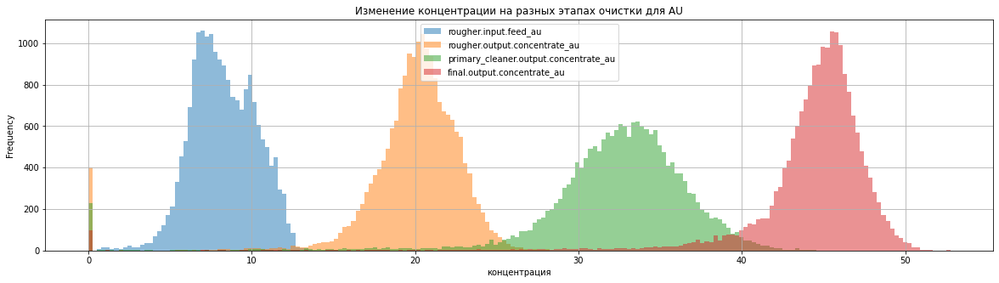

In [11]:
df_au = data_full[['rougher.input.feed_au', 'rougher.output.concentrate_au', 
                   'primary_cleaner.output.concentrate_au', 'final.output.concentrate_au']]
df_au.plot(title = 'Изменение концентрации на разных этапах очистки для AU',
        kind='hist', 
        bins=200, 
        grid=True, 
        legend=True,
        figsize=(20, 5),
        alpha=0.5).set(xlabel='концентрация'); 

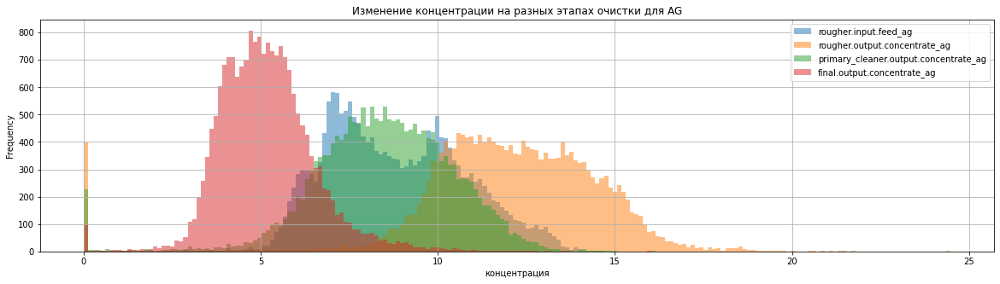

In [12]:
df_ag = data_full[['rougher.input.feed_ag', 'rougher.output.concentrate_ag', 
                   'primary_cleaner.output.concentrate_ag', 'final.output.concentrate_ag']]
df_ag.plot(title = 'Изменение концентрации на разных этапах очистки для AG',
        kind='hist', 
        bins=200, 
        grid=True, 
        legend=True,
        figsize=(20, 5),
        alpha=0.5).set(xlabel='концентрация'); 

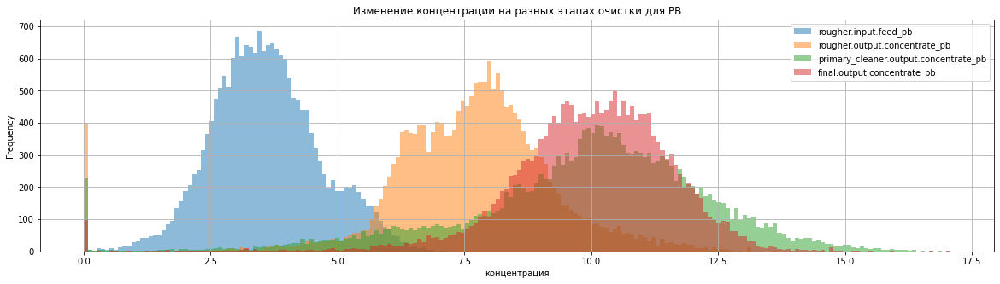

In [13]:
df_pb = data_full[['rougher.input.feed_pb', 'rougher.output.concentrate_pb', 
                   'primary_cleaner.output.concentrate_pb', 'final.output.concentrate_pb']]
df_pb.plot(title = 'Изменение концентрации на разных этапах очистки для PB',
        kind='hist', 
        bins=200, 
        grid=True, 
        legend=True,
        figsize=(20, 5),
        alpha=0.5).set(xlabel='концентрация');

rougher.input.feed_au                     8.266097
rougher.output.concentrate_au            19.772000
primary_cleaner.output.concentrate_au    32.119400
final.output.concentrate_au              44.076513
dtype: float64

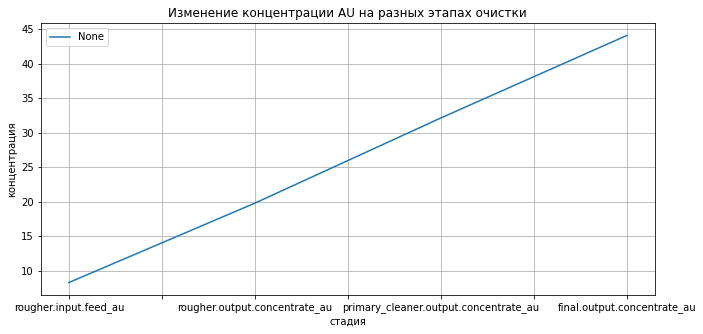

In [14]:
df_au.mean().plot(title='Изменение концентрации AU на разных этапах очистки', 
        grid=True, 
        legend=True, 
        figsize=(11, 5)).set(xlabel='стадия', ylabel = 'концентрация')

display(df_au.mean())

rougher.input.feed_ag                     8.794927
rougher.output.concentrate_ag            11.994759
primary_cleaner.output.concentrate_ag     8.442408
final.output.concentrate_ag               5.168470
dtype: float64

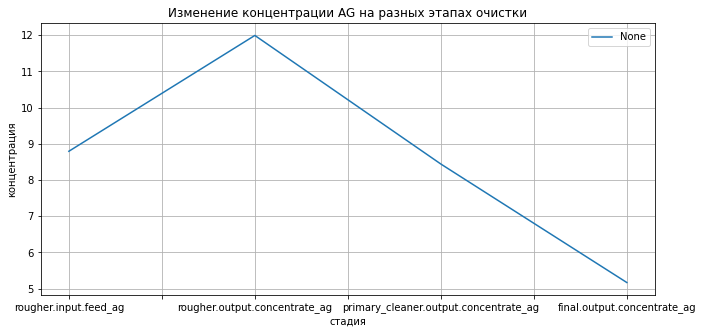

In [15]:
df_ag.mean().plot(title='Изменение концентрации AG на разных этапах очистки', 
        grid=True, 
        legend=True, 
        figsize=(11, 5)).set(xlabel='стадия', ylabel = 'концентрация')

display(df_ag.mean())

rougher.input.feed_pb                    3.598085
rougher.output.concentrate_pb            7.606272
primary_cleaner.output.concentrate_pb    9.829530
final.output.concentrate_pb              9.978895
dtype: float64

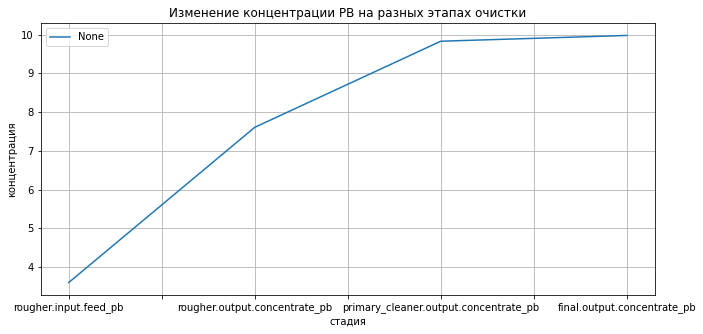

In [16]:
df_pb.mean().plot(title='Изменение концентрации PB на разных этапах очистки', 
        grid=True, 
        legend=True, 
        figsize=(11, 5)).set(xlabel='стадия', ylabel = 'концентрация')

display(df_pb.mean())

На графиках  видимо что концентрация золота с каждым этапом возрастает, как и свинца. Концентрация серебра с каждым этапом уменьшается.

### Сравнение распределения размеров гранул исходного сырья на обучающей и тестовой выборках. 

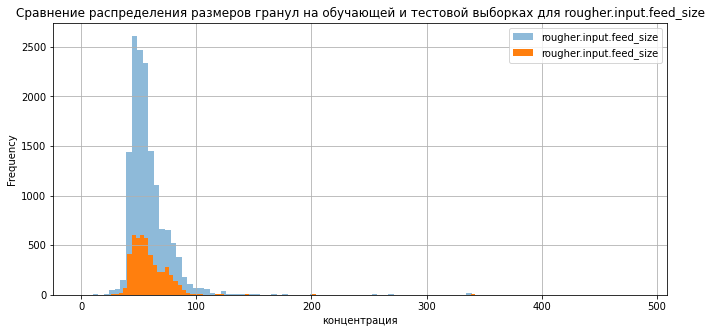

In [17]:
data_train['rougher.input.feed_size'].plot(
    title = 'Сравнение распределения размеров гранул на обучающей и тестовой выборках для rougher.input.feed_size',
    kind='hist', 
    bins=100, 
    grid=True, 
    legend=True,
    figsize=(11, 5),
    alpha=0.5).set(xlabel='концентрация');

data_test['rougher.input.feed_size'].plot(
    title = 'Сравнение распределения размеров гранул на обучающей и тестовой выборках для rougher.input.feed_size',
    kind='hist', 
    bins=100, 
    grid=True, 
    legend=True,
    figsize=(11, 5),
    alpha=1).set(xlabel='концентрация');

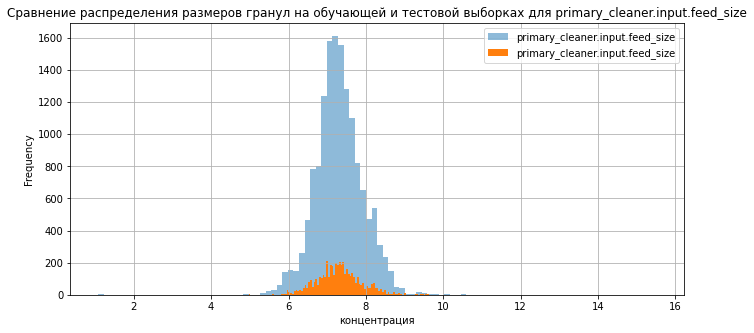

In [18]:
data_train['primary_cleaner.input.feed_size'].plot(
    title = 'Сравнение распределения размеров гранул на обучающей и тестовой выборках для primary_cleaner.input.feed_size',
    kind='hist', 
    bins=100, 
    grid=True, 
    legend=True,
    figsize=(11, 5),
    alpha=0.5).set(xlabel='концентрация');

data_test['primary_cleaner.input.feed_size'].plot(
    title = 'Сравнение распределения размеров гранул на обучающей и тестовой выборках для primary_cleaner.input.feed_size',
    kind='hist', 
    bins=100, 
    grid=True, 
    legend=True,
    figsize=(11, 5),
    alpha=1).set(xlabel='концентрация');

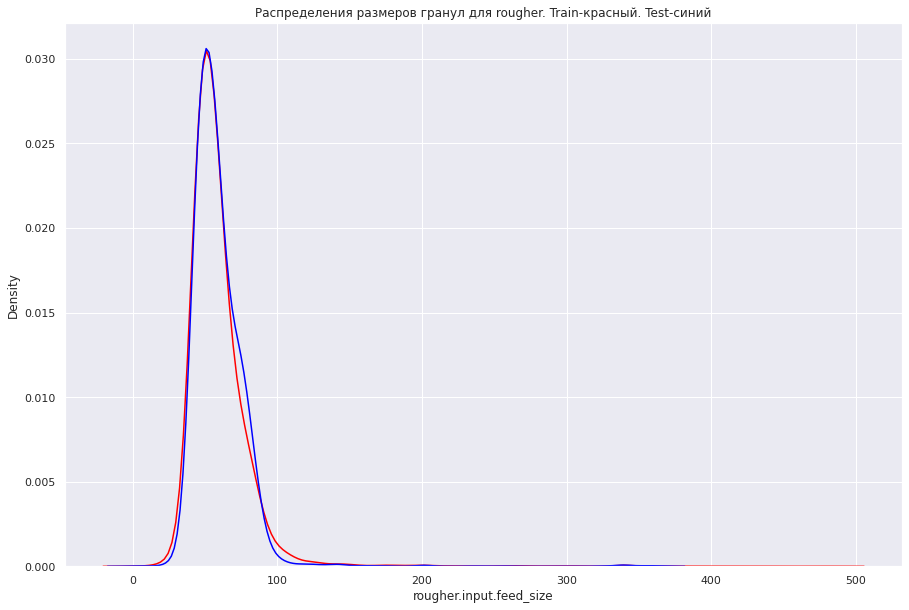

In [19]:
sns.set(rc={'figure.figsize':(15,10)})
sns.kdeplot(data_train['rougher.input.feed_size'], bw_method = .3, 
            color='red').set_title("Распределения размеров гранул для rougher. Train-красный. Test-синий");
sns.kdeplot(data_test['rougher.input.feed_size'], bw_method = .3, 
            color='blue').set_title("Распределения размеров гранул для rougher. Train-красный. Test-синий");

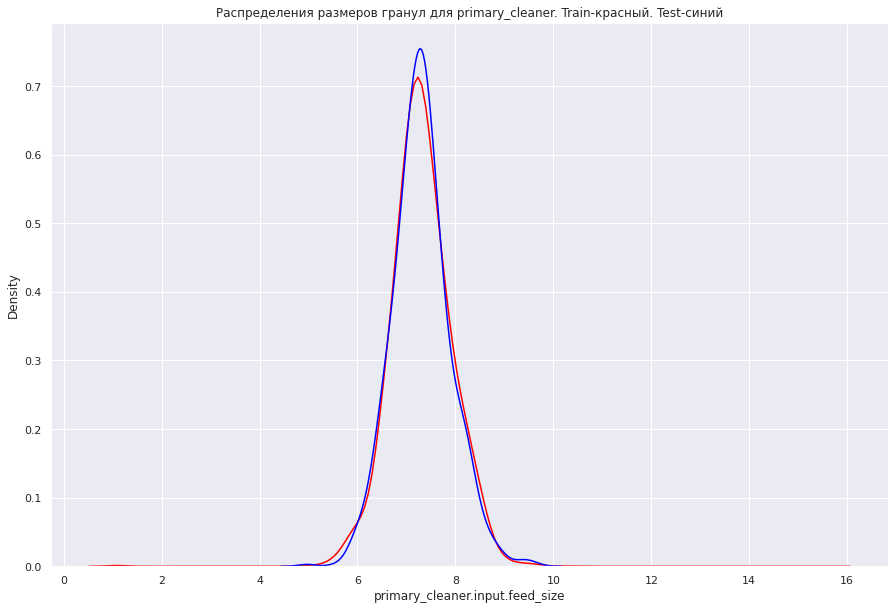

In [20]:
sns.set(rc={'figure.figsize':(15,10)})
sns.kdeplot(data_train['primary_cleaner.input.feed_size'], bw_method = .3, 
            color='red').set_title("Распределения размеров гранул для primary_cleaner. Train-красный. Test-синий");
sns.kdeplot(data_test['primary_cleaner.input.feed_size'], bw_method = .3, 
            color='blue').set_title("Распределения размеров гранул для primary_cleaner. Train-красный. Test-синий");

Мы видим, что распределения размеров гранул сырья на обучающей и тестовой выборках совпадают, а значит с оценков все в порядке.

### Исследование суммарной концентрации металлов на разных стадиях: в сырье, в черновом концентрате, в концентрате после первой очистки и в финальном концентрате.

In [10]:
data1 = data_train[['rougher.input.feed_au','rougher.input.feed_ag','rougher.input.feed_pb', 
                   'rougher.input.feed_sol']].sum(axis=1).to_frame (name='rougher.input.feed')
data2 = data_train[['rougher.output.concentrate_au','rougher.output.concentrate_ag','rougher.output.concentrate_pb', 
                   'rougher.output.concentrate_sol']].sum(axis=1).to_frame (name='rougher.output.concentrate')
data3 = data_train[['primary_cleaner.output.concentrate_au','primary_cleaner.output.concentrate_ag',
                   'primary_cleaner.output.concentrate_pb', 
                   'primary_cleaner.output.concentrate_sol']].sum(axis=1).to_frame (name='primary_cleaner.output.concentrate')
data4 = data_train[['final.output.concentrate_au','final.output.concentrate_ag','final.output.concentrate_pb', 
                   'final.output.concentrate_sol']].sum(axis=1).to_frame (name='final.output.concentrate')
data = pd.concat([data1, data2, data3, data4], axis=1)
data.head(5)

,rougher.input.feed,rougher.output.concentrate,primary_cleaner.output.concentrate,final.output.concentrate
date,,,,
2016-01-15 00:00:00,51.680034,66.424950,72.640924,63.644396
2016-01-15 01:00:00,50.659114,67.012710,72.543485,63.957723
2016-01-15 02:00:00,50.609929,66.103793,72.095042,64.311180
2016-01-15 03:00:00,51.061546,65.752751,59.957723,63.573449
2016-01-15 04:00:00,47.859163,65.908382,71.321010,64.004667


,rougher.input.feed,rougher.output.concentrate,primary_cleaner.output.concentrate,final.output.concentrate
count,14579.000000,14579.000000,14579.000000,14579.000000
mean,57.368141,67.804972,60.684505,68.572035
std,7.337656,13.739990,10.565578,8.012399
min,0.040000,0.000000,0.000000,0.000000
25%,53.571208,65.991033,58.951881,68.014187
50%,57.693000,70.350734,62.541132,69.664788
75%,62.122859,74.548465,65.825712,71.419521
max,76.978947,88.140119,78.255313,80.210644


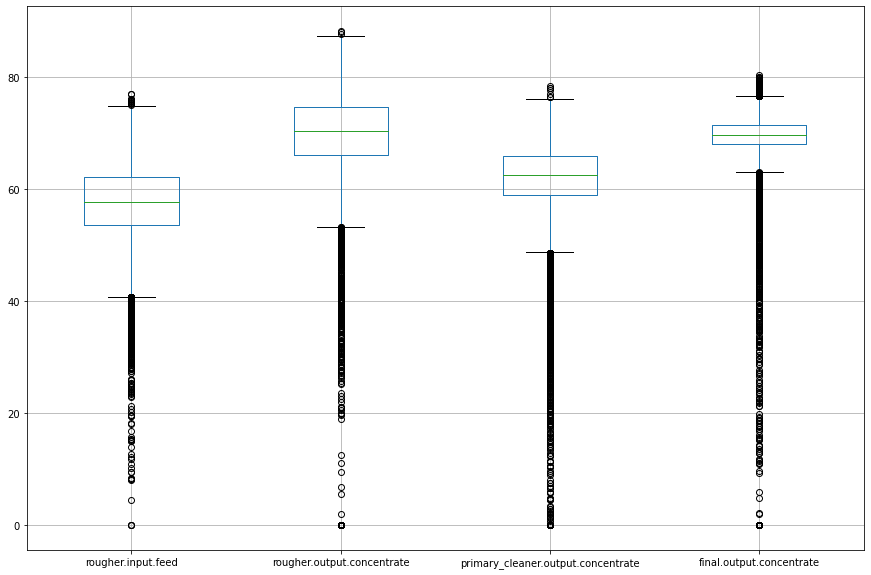

In [11]:
display(data.describe())
    
data.boxplot(figsize=(15, 10));

Мы наблюдаем рост среднего и медианного значения концентрата метеллов по мере приближения к финальной обработке. А так же видим аномалии. Уберем их на тренировочной выборке, что минимизировать неточности в измерениях

In [12]:
for i in data:
    lower_quantile, upper_quantile = data[i].quantile([0.25, 0.75])
    index = data[(data[i] > lower_quantile) & (data[i] < upper_quantile)].index
    data[i] = data.loc[index, i]

In [13]:
data_train = data_train[(data_train['rougher.output.concentrate_au'] != 0) & (data_train['rougher.output.concentrate_ag'] != 0) & (data_train['rougher.output.concentrate_pb'] != 0) & (data_train['rougher.output.concentrate_sol'] != 0)]
data_train = data_train[(data_train['final.output.concentrate_au'] != 0) & (data_train['final.output.concentrate_ag'] != 0) & (data_train['final.output.concentrate_pb'] != 0) & (data_train['final.output.concentrate_sol'] != 0)]
data_train = data_train[(data_train['rougher.output.concentrate_au'] != 0) & (data_train['rougher.output.concentrate_ag'] != 0) & (data_train['rougher.output.concentrate_pb'] != 0) & (data_train['rougher.output.concentrate_sol'] != 0)]
data_train = data_train[(data_train['final.output.concentrate_au'] != 0) & (data_train['final.output.concentrate_ag'] != 0) & (data_train['final.output.concentrate_pb'] != 0) & (data_train['final.output.concentrate_sol'] != 0)]

## Модель

In [18]:
#final.output.recovery
#rougher.output.recovery

def sMAPE(actual, predicted):
    return 1/len(actual)*np.sum(2*np.abs(predicted-actual)/(np.abs(actual)+np.abs(predicted)))*100

def sMAPE_itog(smape_roug, smape_fin):
    return smape_roug*0.25+smape_fin*0.75

In [38]:
custom_score = make_scorer(sMAPE, greater_is_better=False)

In [39]:
model_l_r = LinearRegression()
model_l_r.fit(data_train.iloc[:, 0:22], data_train['rougher.output.recovery'])

smape_roug = cross_val_score(model_l_r, data_train.iloc[:, 0:22], data_train['rougher.output.recovery'],
                             cv=5, scoring=custom_score).mean()
print('Лучшее значение sMAPE после флотации для линейной регрессии:', -smape_roug)


model_r_l = LinearRegression()
model_r_l.fit(data_train.loc[:, data_test.columns], data_train['final.output.recovery'])
smape_fin = cross_val_score(model_r_l, data_train.loc[:, data_test.columns],
                              data_train['final.output.recovery'], cv=5, scoring=custom_score).mean()
print('Лучшее значение sMAPE после очистки при линейной регрессии:', -smape_fin)

print('Лучшее итоговое значение sMAPE для линейной регрессии:', sMAPE_itog(-smape_roug, -smape_fin))

Лучшее значение sMAPE после флотации для линейной регрессии: 6.483209224846442
Лучшее значение sMAPE после очистки при линейной регрессии: 9.535215273341658
Лучшее итоговое значение sMAPE для линейной регрессии: 8.772213761217854


In [28]:
model_f_r = RandomForestRegressor(random_state=12345)

parametrs = {'n_estimators': range (10, 100, 10),
              'max_depth': range (1, 10, 1)}

grid1 = GridSearchCV(model_f_r, parametrs, cv=5, scoring=custom_score)
grid1.fit(data_train.iloc[:, 0:22], data_train['rougher.output.recovery'])
print('Лучшее значение smape после флотации и параметров для RandomForestRegressor:',
      -grid1.best_score_, grid1.best_params_)

Лучшее значение smape после флотации и параметров для RandomForestRegressor: 6.0893457177234565 {'max_depth': 6, 'n_estimators': 10}


In [29]:
grid2 = GridSearchCV(model_f_r, parametrs, cv=5, scoring=custom_score)
grid2.fit(data_train.loc[:, data_test.columns], data_train['final.output.recovery'])
print('Лучшее значение smape после очистки и параметров для RandomForestRegressor:',
      round(-grid2.best_score_,2), grid2.best_params_)
print('Лучшее итоговое значение sMAPE для модели случайного леса:', sMAPE_itog(-grid1.best_score_, -grid2.best_score_))

Лучшее значение smape после очистки и параметров для RandomForestRegressor: 8.94 {'max_depth': 2, 'n_estimators': 50}
Лучшее итоговое значение sMAPE для модели случайного леса: 8.228937817145267


In [40]:
parametrs = {'max_depth': range(2, 11)}
model_t_r = DecisionTreeRegressor(random_state=12345)
grid1 = GridSearchCV(model_t_r, parametrs, cv=5, scoring=custom_score)
grid1.fit(data_train.iloc[:, 0:22], data_train['rougher.output.recovery'])
print('Лучшее значение smape после флотации и параметра глубины для DecisionTreeRegressor:',
      -grid1.best_score_, grid1.best_params_)

grid2 = GridSearchCV(model_t_r, parametrs, cv=5, scoring=custom_score)
grid2.fit(data_train.loc[:, data_test.columns], data_train['final.output.recovery'])
print('Лучшее значение smape после очистки и параметра глубины для DecisionTreeRegressor:',
      -grid2.best_score_, grid2.best_params_)
print('Лучшее итоговое значение sMAPE для дерева случайных решений:', sMAPE_itog(-grid1.best_score_, -grid2.best_score_))

Лучшее значение smape после флотации и параметра глубины для DecisionTreeRegressor: 6.311134337431361 {'max_depth': 2}
Лучшее значение smape после очистки и параметра глубины для DecisionTreeRegressor: 9.307537468313473 {'max_depth': 2}
Лучшее итоговое значение sMAPE для дерева случайных решений: 8.558436685592945


In [37]:
dummy_regr = DummyRegressor(strategy="mean")
dummy_regr.fit(data_train.iloc[:, 0:22], data_train['rougher.output.recovery'])

sm_r = sMAPE(data_full.loc[data_test.index.to_list(), 'rougher.output.recovery'], dummy_regr.predict(data_test.iloc[:, 0:22]))

dummy_regr = DummyRegressor(strategy="mean")
dummy_regr.fit(data_train.loc[:, data_test.columns], data_train['final.output.recovery'])

sm_f = sMAPE(data_full.loc[data_test.index.to_list(), 'final.output.recovery'], dummy_regr.predict(data_test))

print('Значение smape после флотации для DummyRegressor:', sm_r)
print('Значение smape после очистки для DummyRegressor:', sm_f)
print('Значение итогового smape для DummyRegressor:', sMAPE_itog(sm_r, sm_f))


Значение smape после флотации для DummyRegressor: 6.106124479576094
Значение smape после очистки для DummyRegressor: 9.254221385230828
Значение итогового smape для DummyRegressor: 8.467197158817145


Сравнивая все модели с DummyRegressor мы получили: 
1. итоговый smape в DecisionTreeRegressor и LinearRegression получился хуже чем в DummyRegressor
2. итоговый smape в RandomForestRegressor лучше чем в DummyRegressor

Мы создали функцию расчета метрики качества sMAPE, функию расчета итоговой метрики sMAPE_itog, как в ТЗ. Мы нашли лучшие гиперпараметры для 3-х моделей и посчитали итоговый smape. Лучшей моделью оказалась модель случайного леса с итоговым smape = 8.2